Project 4: Generative Adversarial Networks
======
In this project, you are expected to fill in the missing parts of a PyTorch implementation of the Deep Convolutional Generative Adversarial Network (DCGAN) and test its performance on several datasets.

We will be using datasets with small images for this project, because high-resolution GANs take notoriously long to train.

**References:**

[1] [Radford, A., Metz, L. and Chintala, S., 2015. Unsupervised representation learning with deep convolutional generative adversarial networks. arXiv preprint arXiv:1511.06434.](https://arxiv.org/abs/1511.06434)

[2] [MNIST dataset.](http://yann.lecun.com/exdb/mnist/)

[3] [FashionMNIST dataset.](https://github.com/zalandoresearch/fashion-mnist)


## Assignment 4A: DCGAN

### Verify your PyTorch installation

In [1]:
import torch
import torchvision

# Print Basic Information
print('Torch', torch.__version__, 'CUDA', torch.version.cuda)
print("Torchvision", torchvision.__version__)
print('Device:', torch.device('cuda:0'))
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
workers = 4 # The number of parallel processes used to read data
gpu_id = [0,1,2,3] # only modify if you machine has more than one GPU card
torch.cuda.device_count()

Torch 1.3.0 CUDA 10.1.243
Torchvision 0.4.1a0+d94043a
Device: cuda:0


4

In [2]:
#import statements
import os, time
import matplotlib.pyplot as plt
import itertools
import pickle
import imageio
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms, utils
from torch.autograd import Variable
from torchsummary import summary
import numpy as np

In [3]:
workers = 4 # The number of parallel processes used to read data
gpu_id = [0,1,2,3] # only modify if you machine has more than one GPU card

In [4]:
#######################################################################################################
# TODO 2: choose sensible training parameters for DCGAN training. 
# Start with few epochs while you design the network, and increase once you think you have a good setup.
# Since GANs train slowly, you may have to use at quite a few epochs to see good results.
#######################################################################################################
batch_size = 128
lr = 0.0002
num_epochs = 30

nz = 100 #length of latent vector
ngf = 64 #relates to the depth of feature maps carried through the generator
ndf = 64 # Size of feature maps in discriminator
nc = 3  #number of color channels in the input images.

            

### 7) Modify the network to output $64\times64$ RGB images (10 points)

Download `UTK_face.tar.gz` from [Google Drive](https://drive.google.com/drive/folders/0BxYys69jI14kU0I1YUQyY1ZDRUE) and extract the images to your working directory in the folder `./data/UTKFace/train`. This dataset contains approximately 24K cropped images of human faces of mixed age, gender and race.

Load these images and resize them to the dimensions you want to generate ($64\times64$ RGB images). Replicate and modify your Generator and Discriminator network architectures in order to output the appropriate image size and three color channels. You may want to consult the [original DCGAN paper](https://arxiv.org/abs/1511.06434) to check what their suggested architecture looks like. You should generate an output similar to this (or better):

<img src="img/DCGAN_faces.png" width="900">



You can either modify the code above, or copy the necessary code pieces, but make sure you include all results of different datasets in your final report or in this notebook.

In [5]:
#######################################################################################################
# TODO 7: resize the images such that they have the shape of 3x64x64
#######################################################################################################
transform = transforms.Compose([
                    transforms.Resize(64),
                    transforms.CenterCrop(64),
                    transforms.ToTensor(),
    # the pictures in minist dataset is grayscaled, which means there is only one sigle channel
                    transforms.Normalize((0.5,0.5,0.5),(0.5,0.5,0.5))])
    
train_dataset = torchvision.datasets.ImageFolder(
    root='./UTKFace',
    transform=transform
)

print("Dataset length: ", len(train_dataset))
print("Image size: {}".format(train_dataset[0][0].size()))
print("value range: [ {} - {} ]".format(torch.min(train_dataset[0][0]), torch.max(train_dataset[0][0])))

Dataset length:  23708
Image size: torch.Size([3, 64, 64])
value range: [ -0.9607843160629272 - 0.9921568632125854 ]


In [6]:
#######################################################################################################
# TODO 7: train a DCGAN on the face images
#######################################################################################################

In [7]:
#######################################################################################################
# TODO 3a: implement a function that initializes the layer's weights with mean and standard deviation.
#######################################################################################################

def normal_init(layer, mean, std):
    #pass # TODO add your implementation
    nn.init.normal_(layer.weight.data, mean, std)
    

In [6]:
#######################################################################################################
# TODO 3b: implement the generator network for a DCGAN with output size 32x32px
#######################################################################################################
#The job of the generator is to spawn ‘fake’ images that look like the training images. 
#The job of the discriminator is to look at an image and output whether or not it is a real training image 
#or a fake image from the generator. 
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        #pass # TODO add your implementation
        self.generator = nn.Sequential(
            # input is Z, going into a convolution
            
            nn.ConvTranspose2d(nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d(ngf*2,ngf*1,4,2,1,bias=False),
            nn.BatchNorm2d(ngf*1),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf*1, nc, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    # forward method
    def forward(self, x):
        #return None # TODO add your implementation
        return self.generator(x)
        

In [7]:
#######################################################################################################
# TODO 3c: implement the discriminator network for a DCGAN with input size 32x32px
#######################################################################################################
# batch norm and leaky relu functions promote healthy gradient flow
#which is critical for the learning process of both G and D.
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        #pass # TODO add your implementation
        self.discriminator = nn.Sequential(
            # input is (nc) x 32x 32
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 16 x 16
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 8 x 8
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 4 x 4
            
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )


    # forward method
    def forward(self, x):
        #return None # TODO add your implementation
        return self.discriminator(x)
    

In [8]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    #elif classname.find('BatchNorm') != -1:
     #   nn.init.normal_(m.weight.data, 1.0, 0.02)
      #  nn.init.constant_(m.bias.data, 0)

In [9]:
grid_size = 6

#######################################################################################################
# TODO 4: generate a fixed noise vector to repeatedly evaluate the output of the generator 
# with the same noise vector as training progresses
#######################################################################################################
fixed_z = torch.randn(grid_size**2, nz, 1, 1, device=device)

# output generated samples from the current state of the generator network
def show_result(num_epoch, show=False, save=False, grid_size=6, path = 'result.png', useFixed=False):
    with torch.no_grad():
        if useFixed:   
            fake = G(fixed_z).cpu()
        else:
            # TODO generate a new random noise vector
            z = torch.randn(grid_size**2, nz, 1, 1).to(device)
            fake = G(z).cpu()

        fig, ax = plt.subplots(figsize=(8, 8))
        
        image = utils.make_grid(fake.data, grid_size, 1,normalize=True)
        
        plt.imshow(np.transpose(image, (1, 2, 0)))    
        ax.axis('off')
        plt.savefig(path)
        if show:
            plt.show()
        else:
            plt.close()

# plot the losses over time as a curve            
def plot_losses(hist, show=True, save=False, path='progress.png'):
    x = range(len(hist['D_losses']))

    y1 = hist['D_losses']
    y2 = hist['G_losses']

    plt.plot(x, y1, label='D_loss')
    plt.plot(x, y2, label='G_loss')

    plt.xlabel('Iteration')
    plt.ylabel('Loss')

    plt.legend(loc=4)
    plt.grid(True)
    plt.tight_layout()

    if save:
        plt.savefig(path)

    if show:
        plt.show()
    else:
        plt.close()

### 5) Training Setup (5 points) and Training Loop (10 points)

Instantiate a Generator and a discriminator network, move networks to GPU and initialize the weights of their convolutional layers with $\mu=0$ and $\sigma=0.02$.

Create an ADAM optimizer for the generator as well as the discriminator with your chosen learning rate. Use $\beta_1=0.5$ and $\beta_2=0.999$ as described in Section 4 of the paper.

In the training loop, evaluate the output of the generator network on a random latent vector of length 100. Then, evaluate the performance of the discriminator on the generated images as well as the real image minibatch. Assign the real results the label $1$ (`torch.ones`) and the fake results the label $0$ (`torch.zeros`), then calculate the losses for each of these steps using Binary Cross Entropy loss.
        

#### Hint:
If you would like to load a stored model for additional training or for evaluation, you can do it the following way:
```
M = MyNetwork() #instantiate the network
checkpoint = torch.load("path_to_stored_network.pkl")
M.load_state_dict(checkpoint)
M.eval()
``` 

*If your model fails to train properly, include the failure cases into your report, explain what you think went wrong, and try again!*

In [10]:
data_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True,num_workers=workers)

dset_name = 'myDataset_UTKFace' #pick a meaningful name
result_dir = '{}_DCGAN'.format(dset_name)


In [11]:
#######################################################################################################
# TODO 5a: Fill code for training setup
#######################################################################################################

# define networks

G = Generator().to(device)
G = nn.DataParallel(G, device_ids=[g for g in gpu_id])
D = Discriminator().to(device)
D = nn.DataParallel(D, device_ids=[g for g in gpu_id])



# define optimizers
# Initialize BCELoss function
criterion = nn.BCELoss()
G_optimizer = optim.Adam(G.parameters(), lr=lr, betas=(0.5, 0.999))
D_optimizer = optim.Adam(D.parameters(), lr=lr, betas=(0.5, 0.999))


G.apply(weights_init)
D.apply(weights_init)

DataParallel(
  (module): Discriminator(
    (discriminator): Sequential(
      (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
      (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (4): LeakyReLU(negative_slope=0.2, inplace=True)
      (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (7): LeakyReLU(negative_slope=0.2, inplace=True)
      (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (10): LeakyReLU(negative_slope=0.2, inplace=True)
      (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=Fa

In [14]:
# results save folder
if not os.path.isdir(result_dir):
    os.mkdir(result_dir)
if not os.path.isdir(result_dir+'/Random'):
    os.mkdir(result_dir+'/Random')
if not os.path.isdir(result_dir+'/Fixed'):
    os.mkdir(result_dir+'/Fixed')

Training ...
Epoch [1 / 30] G loss: 6.501944541931152 D loss: 0.1819278597831726


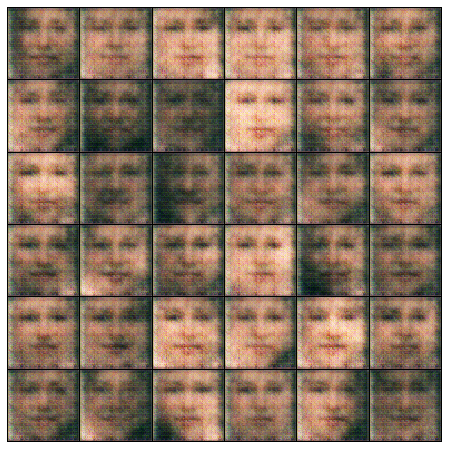

Epoch [2 / 30] G loss: 7.183326244354248 D loss: 0.5780123472213745


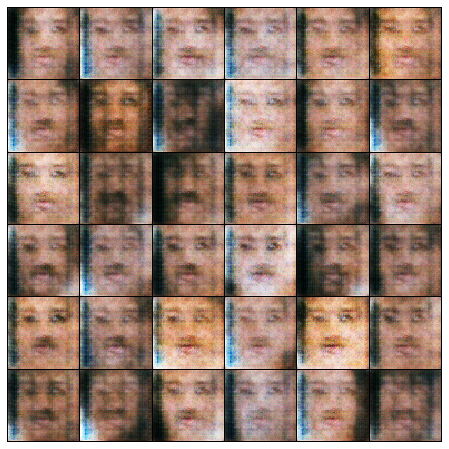

Epoch [3 / 30] G loss: 1.4892035722732544 D loss: 1.9958415031433105


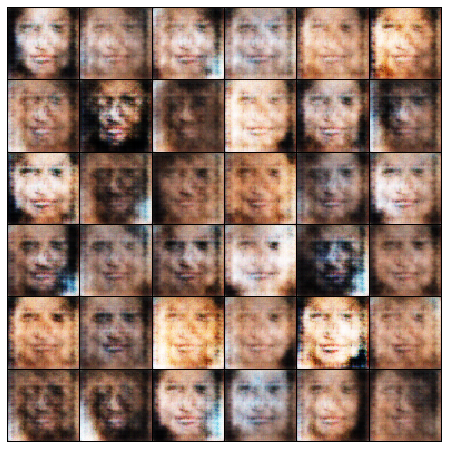

Epoch [4 / 30] G loss: 6.011685848236084 D loss: 0.651486337184906


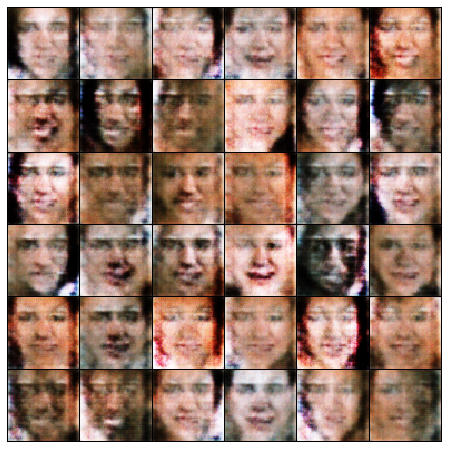

Epoch [5 / 30] G loss: 5.884143352508545 D loss: 0.440800279378891


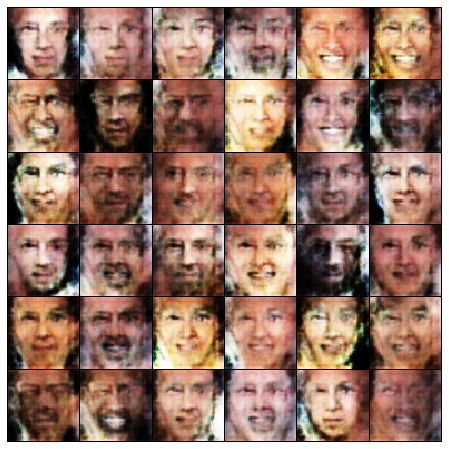

Epoch [6 / 30] G loss: 9.548126220703125 D loss: 1.3948776721954346


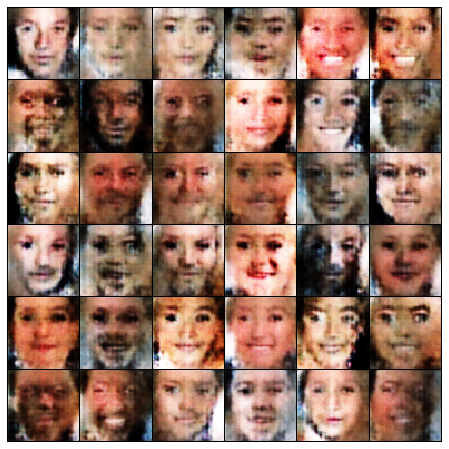

Epoch [7 / 30] G loss: 3.696784496307373 D loss: 0.5246117115020752


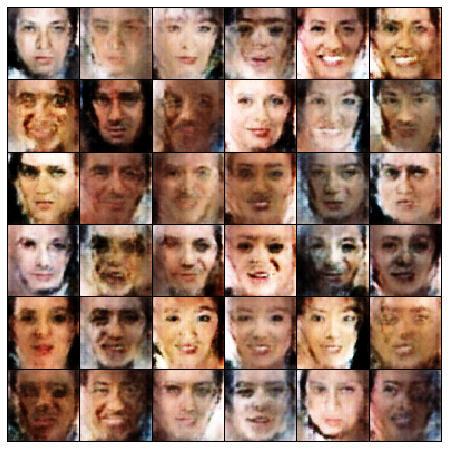

Epoch [8 / 30] G loss: 4.531506061553955 D loss: 0.45708179473876953


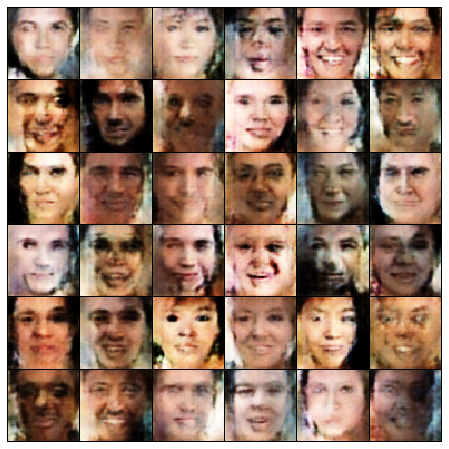

Epoch [9 / 30] G loss: 1.6976593732833862 D loss: 0.8815239071846008


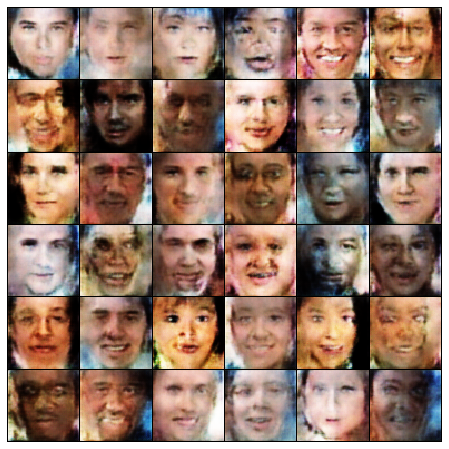

Epoch [10 / 30] G loss: 0.4157017171382904 D loss: 1.3236287832260132


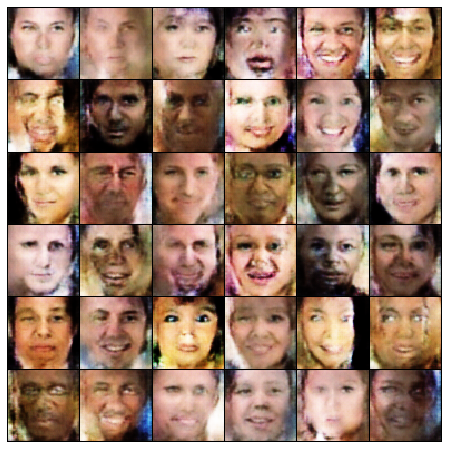

Epoch [11 / 30] G loss: 3.481426239013672 D loss: 0.4084020256996155


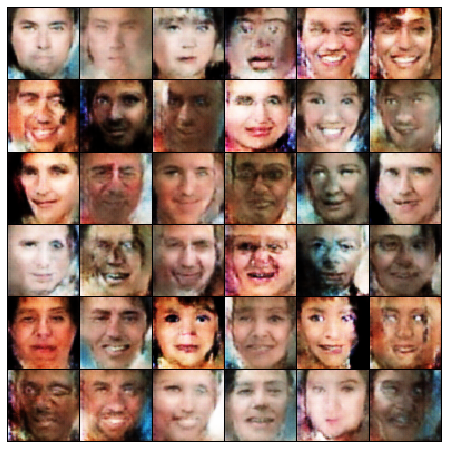

Epoch [12 / 30] G loss: 2.072420358657837 D loss: 0.7809474468231201


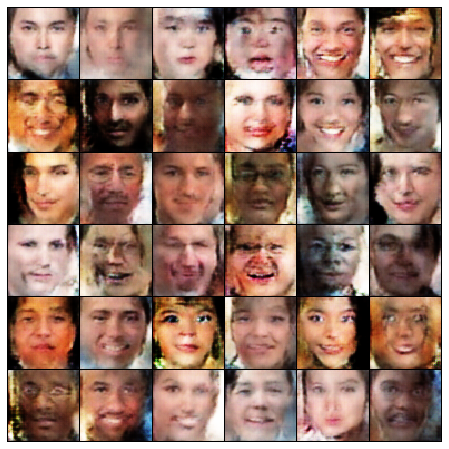

Epoch [13 / 30] G loss: 3.4945461750030518 D loss: 0.4925523102283478


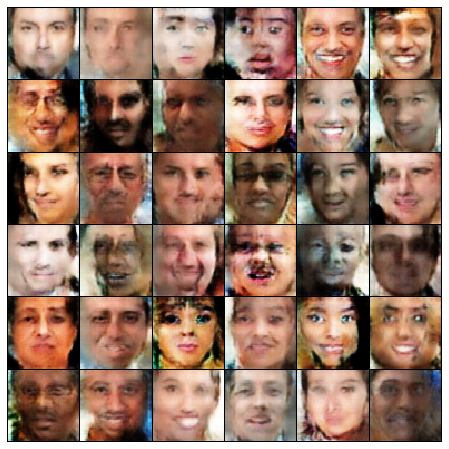

Epoch [14 / 30] G loss: 2.570805072784424 D loss: 0.3798523545265198


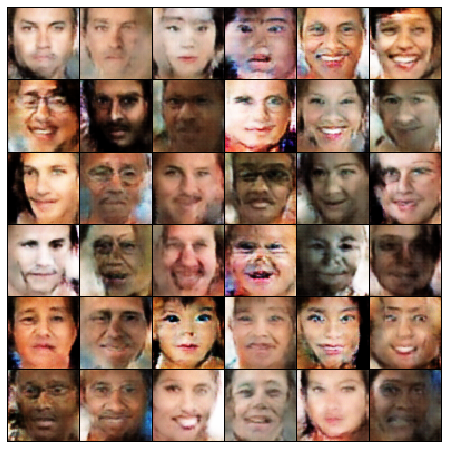

Epoch [15 / 30] G loss: 2.1223738193511963 D loss: 0.5774235725402832


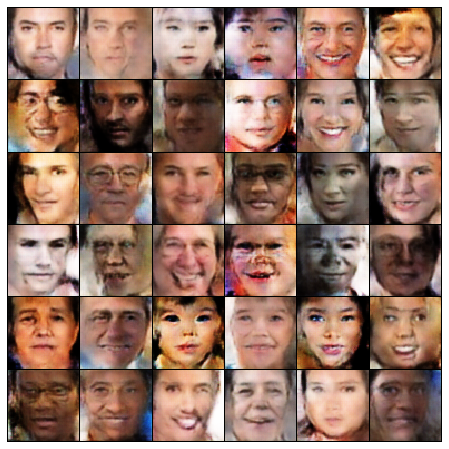

Epoch [16 / 30] G loss: 6.2595086097717285 D loss: 0.8744906187057495


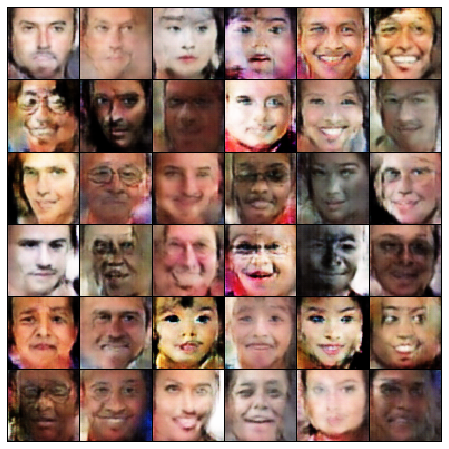

Epoch [17 / 30] G loss: 2.635901927947998 D loss: 0.47204941511154175


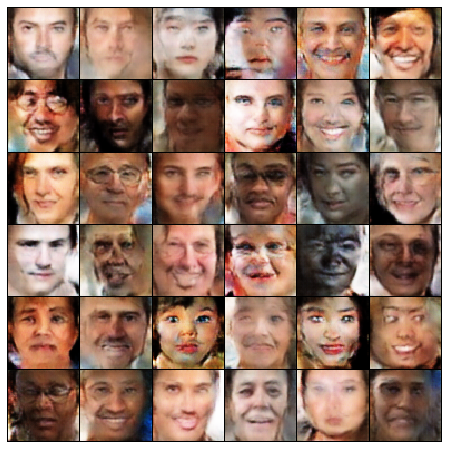

Epoch [18 / 30] G loss: 5.941165447235107 D loss: 0.7987715005874634


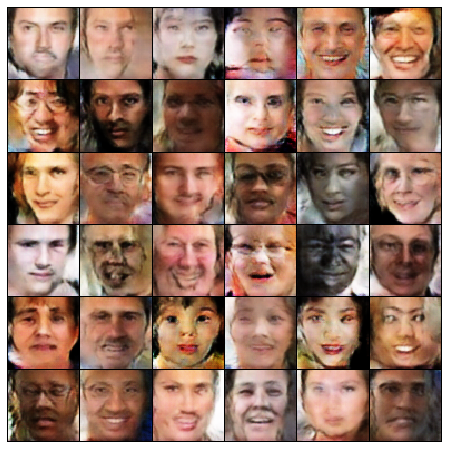

Epoch [19 / 30] G loss: 2.3909945487976074 D loss: 0.38202500343322754


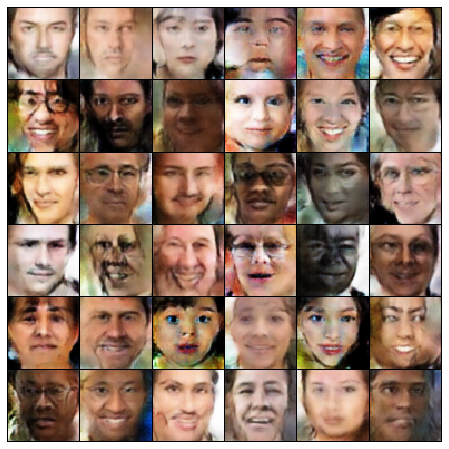

Epoch [20 / 30] G loss: 3.430302381515503 D loss: 0.6846375465393066


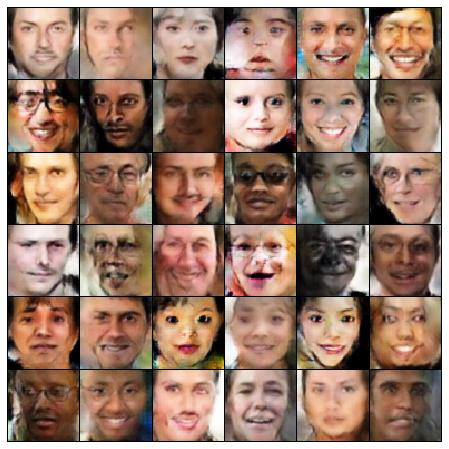

Epoch [21 / 30] G loss: 3.0509722232818604 D loss: 0.4283546805381775


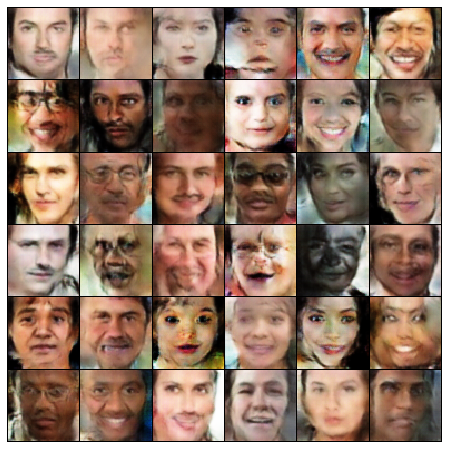

Epoch [22 / 30] G loss: 1.6692074537277222 D loss: 1.2658778429031372


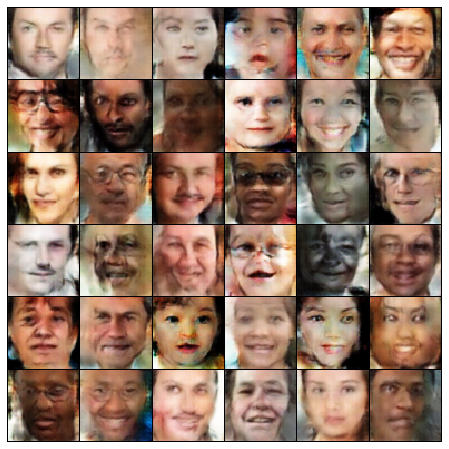

Epoch [23 / 30] G loss: 2.4754555225372314 D loss: 0.8528209328651428


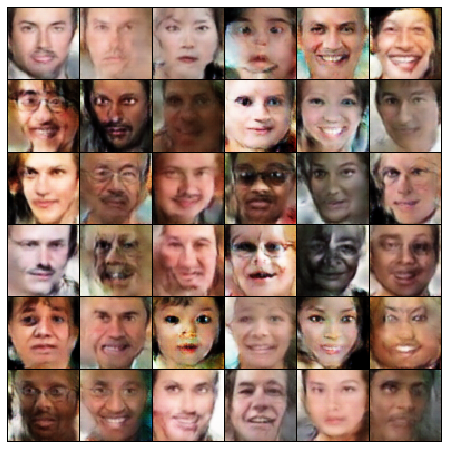

Epoch [24 / 30] G loss: 3.478722095489502 D loss: 0.44475606083869934


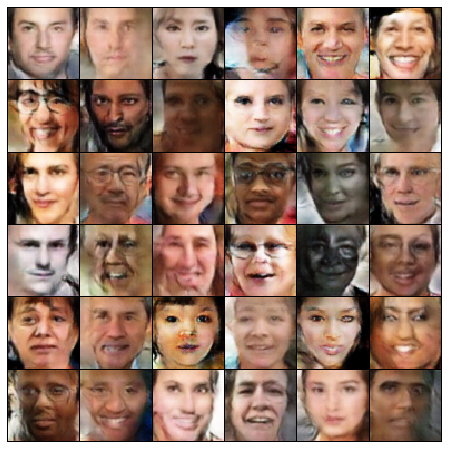

Epoch [25 / 30] G loss: 6.162563800811768 D loss: 2.052581787109375


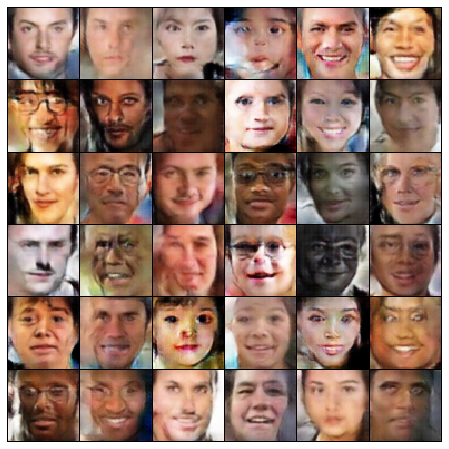

Epoch [26 / 30] G loss: 2.5276458263397217 D loss: 0.45930594205856323


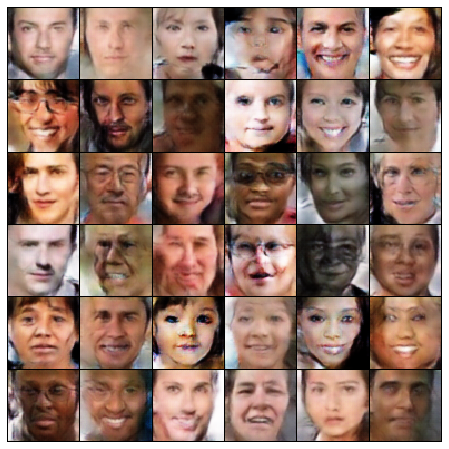

Epoch [27 / 30] G loss: 1.9041054248809814 D loss: 0.7961381077766418


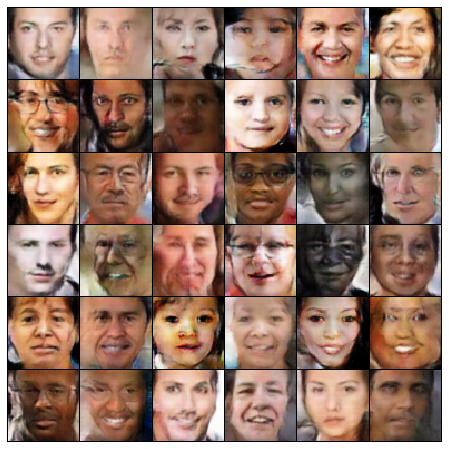

Epoch [28 / 30] G loss: 1.5024479627609253 D loss: 0.6756186485290527


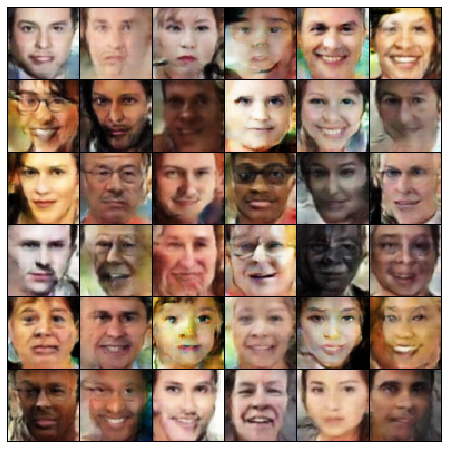

Epoch [29 / 30] G loss: 3.695821523666382 D loss: 0.825180172920227


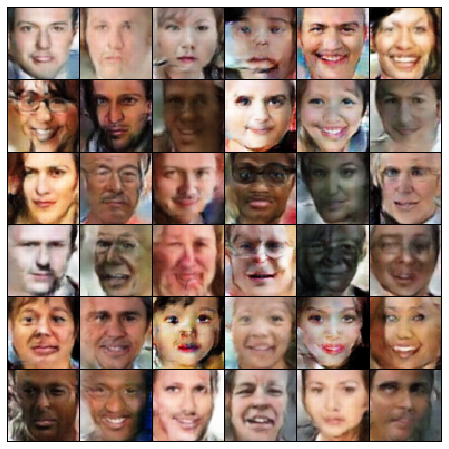

Epoch [30 / 30] G loss: 5.372632026672363 D loss: 0.788398265838623


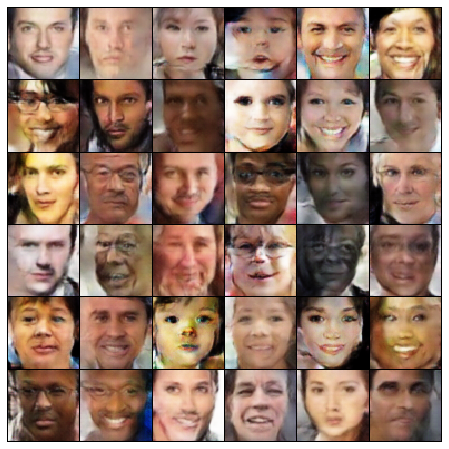

Avg per epoch time: 23.79 sec, total 30 epochs time: 12.15 min
Training finished!
...saving training results


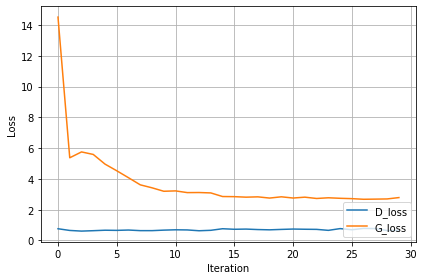

In [15]:
progress = {}
progress['D_losses'] = []
progress['G_losses'] = []
progress['per_epoch_times'] = []
progress['total_time'] = []
num_iter = 0

# start training loop
print('Training ...')
start_time = time.time()
for epoch in np.arange(num_epochs):
    
    D_losses = []
    G_losses = []
    
    epoch_start_time = time.time()
    for real, _ in data_loader:
        real = real.to(device)
        batch_size = real.size(0)
        
        #######################################################################################################
        # TODO 5b: Fill code for training loop
        #######################################################################################################
        
        # generate random latent vector z and real and fake labels 
        z = torch.randn(batch_size, nz, 1, 1).to(device)
        real_label = torch.full((batch_size,), 1).to(device)
        fake_label = torch.full((batch_size,), 0).to(device)
    
        # TODO 
        
        # generate fakes    
        fakes = G(z)

        # TODO 
        
        # evaluate fakes
        err_fakes_D = criterion(D(fakes.detach()).view(-1), fake_label)
        
        # TODO 

        # evaluate real minibatch
        err_real_D = criterion(D(real).view(-1), real_label)
         
        # TODO
        
        # accumulate discriminator loss from the information about the real and fake images it just saw
        D_train_loss = err_fakes_D + err_real_D

        # train discriminator D step
        D.zero_grad()
        D_train_loss.backward()
        D_optimizer.step()    
        
        # train generator to output an image that is classified as real              
        G_train_loss = criterion(D(fakes).view(-1), real_label)
        
        # train generator G step
        G.zero_grad()
        G_train_loss.backward()
        G_optimizer.step()              

        D_losses.append(D_train_loss.data.item())
        G_losses.append(G_train_loss.data.item())

        num_iter += 1

    epoch_end_time = time.time()
    per_epoch_time = epoch_end_time - epoch_start_time
    
    print('Epoch [{} / {}] G loss: {} D loss: {}'.format(epoch + 1, num_epochs, G_train_loss, D_train_loss))

    show_result( epoch, save=True, path=result_dir + '/Random/{}_DCGAN_{}.png'.format(dset_name, epoch), useFixed=False )
    show_result( epoch, save=True, show=True, path=result_dir + '/Fixed/{}_DCGAN_{}.png'.format(dset_name, epoch), useFixed=True )
    progress['D_losses'].append(torch.mean(torch.FloatTensor(D_losses)))
    progress['G_losses'].append(torch.mean(torch.FloatTensor(G_losses)))
    progress['per_epoch_times'].append(per_epoch_time)

end_time = time.time()
total_time = end_time - start_time
progress['total_time'].append(total_time)

print('Avg per epoch time: {:.2f} sec, total {:d} epochs time: {:.2f} min'.format(torch.mean(torch.FloatTensor(progress['per_epoch_times'])), num_epochs, total_time / 60))
print('Training finished!')
print('...saving training results')

torch.save(G.state_dict(), result_dir + '/generator_network.pkl')
torch.save(D.state_dict(), result_dir + '/discriminator_network.pkl')
with open(result_dir + '/progress.pkl', 'wb') as f:
    pickle.dump(progress, f)

# plot the loss curves    
plot_losses(progress, save=True, path=result_dir + '/{}_DCGAN_progress.png'.format(dset_name))

# Visualize the training progress as an animated GIF
images = []
for e in range(num_epochs):
    img_name = result_dir + '/Fixed/{}_DCGAN_{}.png'.format(dset_name, e)
    images.append(imageio.imread(img_name))
imageio.mimsave(result_dir + '/DCGAN_generation_animation.gif', images, fps=5)

<img src='myDataset_UTKFace_DCGAN/DCGAN_generation_animation.gif' style='margin: 0px 10px' align='left' width="1024">

Becuase of the time comsuming, I used command line to train. The training log is log.12906456

### 8) Create a latent space walk of the Face Generator you trained (5 points)
To that end, generate as many random latents as your animation has number of frames. Then, use a gaussian filter on those latents in order to create a smooth blending between adjacent frames in the animation. Have a look at `scipy.ndimage.gaussian_filter` for that purpose. Make sure that your animation can loop endlessly, i.e. the last frames and the first frames of the animation also blend. The $\sigma$ value of the gaussian filter defines how many frames are blended; use the given parameter values of the function to control this value.<br>
Your output should look like this (or better):

<img src='img/Faces_DCGAN_latent_walk_1.gif' style='margin: 0px 10px' align='left' width="128">

<img src='img/Faces_DCGAN_latent_walk_2.gif' style='margin: 0px 10px' align='left' width="128">

<img src='img/Faces_DCGAN_latent_walk_3.gif' style='margin: 0px 10px' align='left' width="128">

In [12]:
from scipy.ndimage import gaussian_filter
from torchvision.utils import save_image

In [13]:
G = Generator().to(device)
G = nn.DataParallel(G, device_ids=[g for g in gpu_id])
G.load_state_dict(torch.load('./myDataset_UTKFace_DCGAN/generator_network.pkl'))
G.eval().to(device)

DataParallel(
  (module): Generator(
    (generator): Sequential(
      (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
      (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (8): ReLU(inplace=True)
      (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (11): ReLU(inplace=True)
      (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=

In [14]:
class DeNormalize(object):
    def __init__(self, mean, std):
        self.mean = mean
        self.std = std

    def __call__(self, tensor):
        """
        Args:
            tensor (Tensor): Tensor image of size (C, H, W) to be normalized.
        Returns:
            Tensor: Normalized image.
        """
        for t, m, s in zip(tensor, self.mean, self.std):
            t.mul_(s).add_(m)
            # The normalize code -> t.sub_(m).div_(s)
        return tensor

In [19]:
def generate_latent_walk(duration_sec=20.0, smoothing_sec=0.5, fps=30):
    #######################################################################################################
    # TODO 8: create a smoothly interpolated loop through random latent space values
    #######################################################################################################
    num = int(duration_sec/smoothing_sec) ###number of vertors
    
    latent_vectors = torch.randn(num,nz,1,1)
    z_s = latent_vectors[0].view(-1,nz,1,1)
    for i in range(0,num-1):
        vector_one = latent_vectors[i].view(-1,nz,1,1)
        vector_two = latent_vectors[i+1].view(-1,nz,1,1)
        difference = vector_two -  vector_one
        interpolarion = difference / (fps-1)
        for j in range(1, fps-1):
            z = interpolarion * j + vector_one
            z_s = torch.cat((z_s, z), 0)
        z_s = torch.cat((z_s, vector_two), 0)
        latent_vectors[i+1] = torch.tensor(gaussian_filter(vector_one, sigma=0.5))
    z_s = z_s.to(device)
    fakes = G(z_s).detach()
    
    
    images=fakes.data.cpu()
    #transform = DeNormalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
    transform= transforms.Normalize(
    mean=(-0.5/0.5, -0.5/0.5, -0.5/0.5),
    std=(1/0.5, 1/0.5, 1/0.5))
    for i,tensor in enumerate(images):
        image = transform(tensor)
        #img = img.detach().cpu().numpy()[0][0]
        #img = image
        #image = ((img +1) * (1/2 * 255))
        
        #image=tensor
        #image = tensor*0.5+0.5
        #print(image.max())
        save_image(image, result_dir+'/latent_walk_img_{}.png'.format(i))
    
    #images = fakes.data.cpu()
    
    #for i in range(len(images)):
     #   save_image(images[i], result_dir+'/latent_walk_img_{}.png'.format(i))
        

In [17]:
def generate_latent_walk(duration_sec=20.0, smoothing_sec=5, fps=30):
    #######################################################################################################
    # TODO 8: create a smoothly interpolated loop through random latent space values
    #######################################################################################################
    num = int(duration_sec*smoothing_sec) ###number of vertors
    
    latent_vectors = torch.randn(num,nz,1,1)
    z_s = latent_vectors[0].view(-1,nz,1,1)
    for i in range(0,num-1):
        vector_one = latent_vectors[i].view(-1,nz,1,1)
        vector_two = latent_vectors[i+1].view(-1,nz,1,1)
        difference = vector_two -  vector_one
        interpolarion = difference / (fps-1)
        for j in range(1, fps-1):
            z = interpolarion * j + vector_one
            z_s = torch.cat((z_s, z), 0)
        z_s = torch.cat((z_s, vector_two), 0)
        latent_vectors[i+1] = torch.tensor(gaussian_filter(vector_one, sigma=5*30))
     
    z_s = z_s.to(device)
    fakes = G(z_s).detach()
    images=fakes.data.cpu()
    transform = DeNormalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
    for i,tensor in enumerate(images):
        image=tensor
        image = transform(tensor)
        #img = img.detach().cpu().numpy()[0][0]
        #img = image
        #image = ((img +1) * (1/2 * 255))
        
        #image=tensor
        #image = tensor*0.5+0.5
        #print(image.max())
        save_image(image, result_dir+'/latent_walk_img_{}.png'.format(i))
    
    #images = fakes.data.cpu()

    
    
    
    
    #for i in range(len(images)):
     #   save_image(images[i], result_dir+'/latent_walk_img_{}.png'.format(i))
        

In [18]:
generate_latent_walk()
images = []
for i in range(2872):
    images.append(imageio.imread(result_dir+'/latent_walk_img_{}.png'.format(i)))
imageio.mimsave(result_dir + '/latent_space_walk.gif', images, fps=30)

  
    #images = None #TODO create smoothly interpolating images
    
    #imageio.mimsave(result_dir + '/latent_space_walk.gif', images, fps=fps)

#generate_latent_walk()       

<img src='myDataset_UTKFace_DCGAN/latent_space_walk.gif' style='margin: 0px 10px' align='left' width="256">

In [22]:
result_dir

'myDataset_UTKFace_DCGAN'